### Import Required Packages

In [1]:
# Python 3 environment 
import os

# Machine Learning Classifiers
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

# Unsupervised Clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture

# Classifier Evaluation Tools
from sklearn.feature_selection import RFECV
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict # for K-fold cross validation

# Processing and Visualization Libraries
import numpy as np
import pandas as pd
from IPython.display import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from matplotlib.colors import ListedColormap
import graphviz
import zipfile
import random

import warnings
warnings.filterwarnings('ignore')
from IPython.core.display import display,HTML
display(HTML('<style>.prompt{width: 0px; min-width: 0px; visibility: collapse}</style>'))

Load data from zipped csv:

In [2]:
# Unzip data
train_csv = zipfile.ZipFile('pp-data1.zip') 
# Read data 
data = pd.read_csv(train_csv.open('pp_data5_train.csv'))
test_data = pd.read_csv(train_csv.open('pp_data5_test.csv'))

### EDA

The nanoparticle arrangement data were prepared using Monte Carlo simulations. It does not contain any missing values nor outliers as those were handled in advanced during the simulations.

Quick looks at the data structure

In [3]:
# Data frame information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12254 entries, 0 to 12253
Data columns (total 15 columns):
sim_id                      12254 non-null int64
n_temperature               12254 non-null float64
n_pressure                  12254 non-null float64
box_size                    12254 non-null float64
particle_type               12254 non-null int64
particle_shape              12254 non-null int64
particle_size               12254 non-null float64
particle_number             12254 non-null int64
polymer_type                12254 non-null int64
polymer_density             12254 non-null float64
polymer_length              12254 non-null float64
poly_part_interaction       12254 non-null float64
poly_poly_interaction       12254 non-null float64
polymer_grafting_density    12254 non-null float64
cluster                     12254 non-null int64
dtypes: float64(9), int64(6)
memory usage: 1.4 MB


In [4]:
# Data frame summary
data.describe()

,sim_id,n_temperature,n_pressure,box_size,particle_type,particle_shape,particle_size,particle_number,polymer_type,polymer_density,polymer_length,poly_part_interaction,poly_poly_interaction,polymer_grafting_density,cluster
count,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000,12254.000000
mean,11373.500000,1.000801,0.901376,101298.264215,1.380692,2.219847,8.448335,55.184838,2.989636,0.825072,43.730276,-0.023743,-0.050331,0.325741,2.005386
std,3537.569434,0.118048,0.019136,27051.765204,0.497367,0.785267,1.810216,26.091838,0.130191,0.041234,9.865577,0.170815,0.187716,0.143987,0.815645
min,5247.000000,0.800000,0.800000,50000.000000,1.000000,1.000000,5.000000,10.000000,2.000000,0.750000,0.000000,-1.000000,-0.982227,0.000000,1.000000
25%,8310.250000,0.900000,0.892080,77661.880160,1.000000,2.000000,7.011470,33.000000,3.000000,0.789214,38.756507,-0.103809,-0.148107,0.229930,1.000000
50%,11373.500000,1.000000,0.901370,101240.987150,1.000000,2.000000,8.412854,56.000000,3.000000,0.824990,44.125546,-0.023190,-0.044385,0.325202,2.000000
75%,14436.750000,1.100000,0.910767,124683.194767,2.000000,3.000000,9.736007,77.000000,3.000000,0.860501,49.259644,0.053129,0.057341,0.441358,3.000000
max,17500.000000,1.200000,1.000000,150000.000000,4.000000,3.000000,14.964950,100.000000,4.000000,0.900000,100.000000,1.000000,1.000000,0.600000,3.000000


Variable correlation

In [5]:
data.corr()

,sim_id,n_temperature,n_pressure,box_size,particle_type,particle_shape,particle_size,particle_number,polymer_type,polymer_density,polymer_length,poly_part_interaction,poly_poly_interaction,polymer_grafting_density,cluster
sim_id,1.000000,0.000736,0.002918,-0.001344,-0.009562,-0.001165,0.000127,0.003717,-0.001640,0.007130,-0.002366,-0.018769,-0.000745,0.012547,0.012366
n_temperature,0.000736,1.000000,0.278683,0.016958,-0.000548,0.014979,0.007605,0.001470,0.016630,0.006960,-0.009866,0.004096,-0.009856,0.013212,-0.001511
n_pressure,0.002918,0.278683,1.000000,0.004536,0.005342,0.001968,-0.003708,0.011332,0.016663,0.003174,-0.001684,0.009301,0.001059,0.004177,0.012398
box_size,-0.001344,0.016958,0.004536,1.000000,0.006329,0.003407,-0.012792,0.067420,-0.005948,0.001013,0.007332,-0.009562,0.006867,-0.003527,-0.011724
particle_type,-0.009562,-0.000548,0.005342,0.006329,1.000000,0.011998,0.005670,0.002155,0.009261,-0.004100,0.027240,0.080479,0.026109,0.077853,0.053287
particle_shape,-0.001165,0.014979,0.001968,0.003407,0.011998,1.000000,-0.008684,0.009683,0.007121,0.020847,0.011272,0.002369,0.009320,0.046117,-0.005544
particle_size,0.000127,0.007605,-0.003708,-0.012792,0.005670,-0.008684,1.000000,-0.451260,-0.007638,0.009648,-0.002380,-0.011413,-0.004096,-0.010945,-0.013264
particle_number,0.003717,0.001470,0.011332,0.067420,0.002155,0.009683,-0.451260,1.000000,0.019040,-0.007076,0.014077,-0.009590,0.016595,0.005812,0.009571
polymer_type,-0.001640,0.016630,0.016663,-0.005948,0.009261,0.007121,-0.007638,0.019040,1.000000,-0.001012,0.027994,0.020283,0.029898,0.016518,0.014360
polymer_density,0.007130,0.006960,0.003174,0.001013,-0.004100,0.020847,0.009648,-0.007076,-0.001012,1.000000,0.030264,0.021154,0.029982,0.060420,0.072654


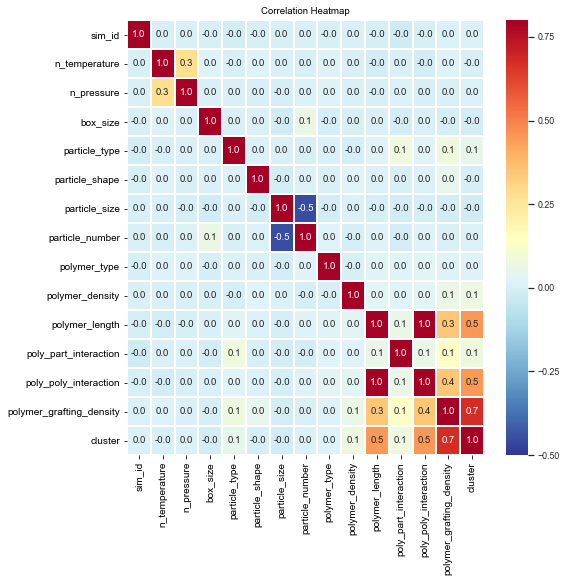

In [6]:
# Correlation map
f,ax = plt.subplots(figsize=(8, 8))
sns.set(font_scale=0.8)
sns.heatmap(data.corr(), annot=True, linewidths=1, cmap = plt.cm.RdYlBu_r, vmin = -0.5, vmax = 0.8,fmt= '.1f')
plt.title('Correlation Heatmap')
plt.show()

Check distribution of each class  of cluster

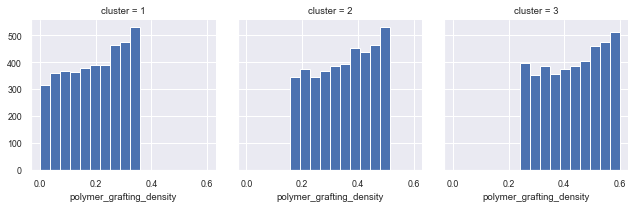

In [7]:
g = sns.FacetGrid(data, col='cluster')
g.map(plt.hist, 'polymer_grafting_density')

Scatter plots of selective variables

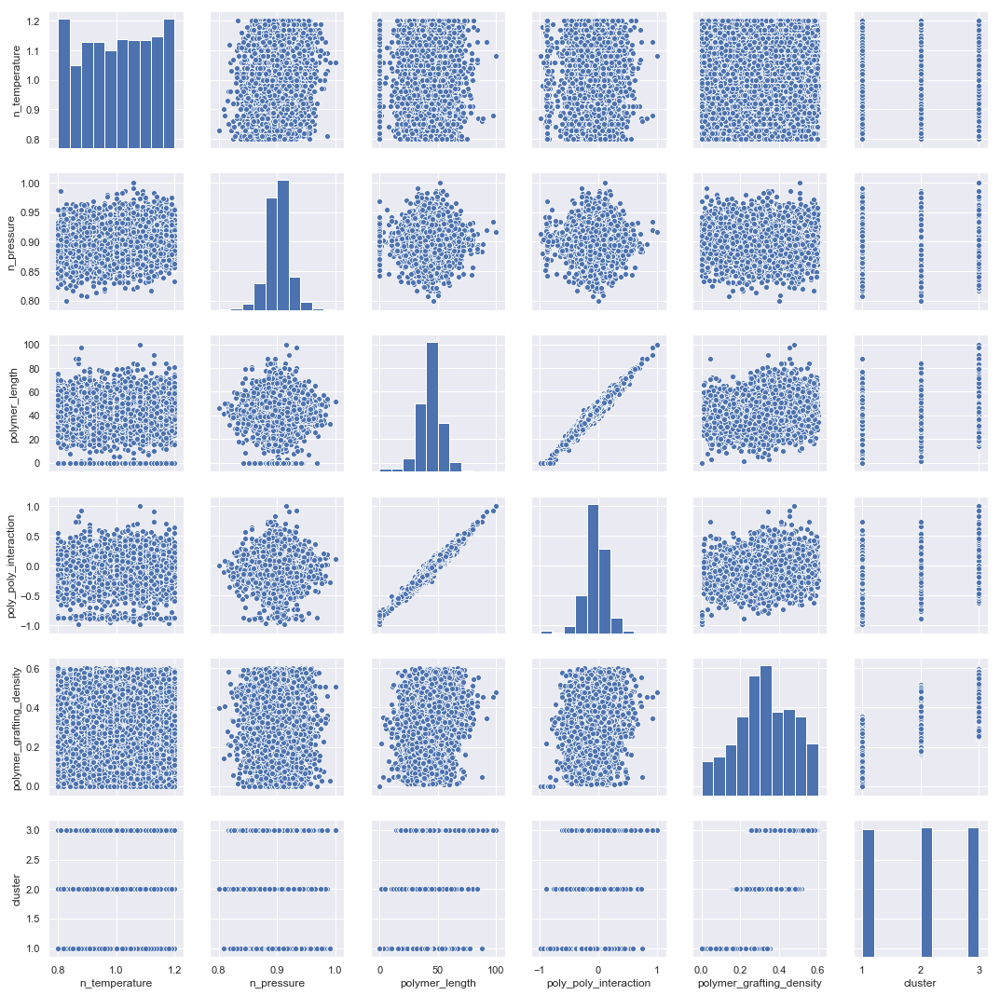

In [8]:
sns.set()
cols = ['n_temperature','n_pressure','polymer_length','poly_poly_interaction','polymer_grafting_density','cluster']
sns.pairplot(data[cols])
plt.show();

In [9]:
train_X=data.iloc[:,1:14]
train_Y=data.iloc[:,14]
test_X=test_data.iloc[:,1:14]
test_Y=test_data.iloc[:,14]

### Decision Tree

In [10]:
# This is where you design the structure of your decision tree
# Lets first try all in default
DT = tree.DecisionTreeClassifier()
# Export the tree in .dot format
dot_data = tree.export_graphviz(DT.fit(train_X,train_Y), 
                            out_file=None,
                            feature_names=train_X.columns,  
                            class_names=None,  
                            filled=True, rounded=True,  
                            special_characters=False)
# Convert dot_data from .dot to .png and rename it as "tree"
graph = graphviz.Source(dot_data, format="png")

# Uncomment the following line if Graphviz not working. Make sure Graphviz2.38 (not just the python packge) is installed in the system.
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'
# 'C:/Program Files (x86)/Graphviz2.38/bin/' should be replaced by the address of where the bin file is.

Image(graph.render("tree"))

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.323124 to fit


Apparently, the above tree is not very informative and most likely overfitted.

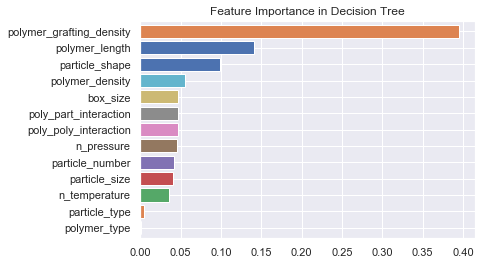

In [11]:
pd.Series(DT.feature_importances_,train_X.columns).sort_values(ascending=True).plot.barh(width=0.8)
plt.title('Feature Importance in Decision Tree')

plt.show()

In [12]:
print(DT)

pred_DT=DT.predict(train_X)
print('Accuracy of the train:', metrics.accuracy_score(pred_DT,train_Y))

pred_DT=DT.predict(test_X)
print('Accuracy of the test:', metrics.accuracy_score(pred_DT,test_Y))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
Accuracy of the train: 1.0
Accuracy of the test: 0.687


Overfitting confirmed!
To prevent overfitting, lets try using parameters that have been tuned to trim the tree.

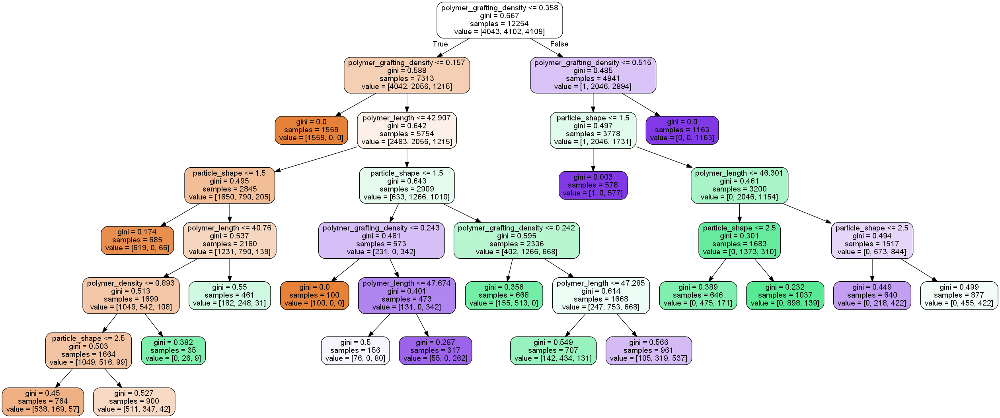

In [13]:
DT = tree.DecisionTreeClassifier(max_depth=12, min_samples_leaf=10, min_impurity_decrease=0.001)
dot_data = tree.export_graphviz(DT.fit(train_X,train_Y),
                            out_file=None,
                            feature_names=train_X.columns,
                            class_names=None,  
                            filled=True, rounded=True,  
                            special_characters=False)
graph = graphviz.Source(dot_data, format="png")
Image(graph.render("tree"))

Models are usually more generic when trees are properly trimmed.

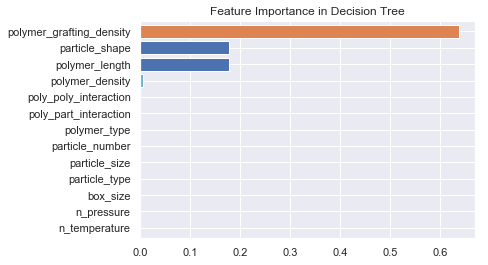

In [14]:
pd.Series(DT.feature_importances_,train_X.columns).sort_values(ascending=True).plot.barh(width=0.8)
plt.title('Feature Importance in Decision Tree')

plt.show()

In [15]:
print(DT)

pred_DT=DT.predict(train_X)
print('Accuracy of the train:', metrics.accuracy_score(pred_DT,train_Y))

pred_DT=DT.predict(test_X)
print('Accuracy of the test:', metrics.accuracy_score(pred_DT,test_Y))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=12,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.001, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
Accuracy of the train: 0.7684837604047657
Accuracy of the test: 0.7525


Quick look at the distribution of the top 3 important features by NP arrangement types.

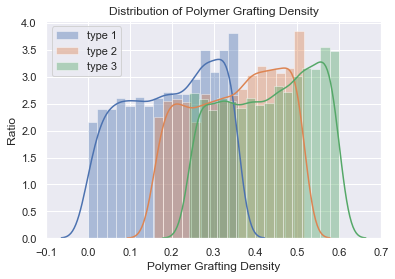

In [16]:
# Distribution plot of polymer grafting density by NP arrangement types (with KDE=True)
sns.distplot(data.loc[data['cluster'] == 1, 'polymer_grafting_density'], label = 'type 1')
sns.distplot(data.loc[data['cluster'] == 2, 'polymer_grafting_density'], label = 'type 2')
sns.distplot(data.loc[data['cluster'] == 3, 'polymer_grafting_density'], label = 'type 3')
plt.legend()
plt.xlabel('Polymer Grafting Density'); plt.ylabel('Ratio'); plt.title('Distribution of Polymer Grafting Density');

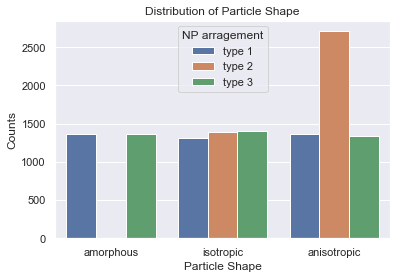

In [17]:
# Distribution plot of particle shape by cluster (with KDE=True)
sns.countplot(x="particle_shape", hue="cluster", data=data).set_xticklabels(['amorphous', 'isotropic', 'anisotropic'])
plt.legend(title='NP arragement', labels=['type 1', 'type 2', 'type 3'])

plt.xlabel('Particle Shape'); plt.ylabel('Counts'); plt.title('Distribution of Particle Shape');

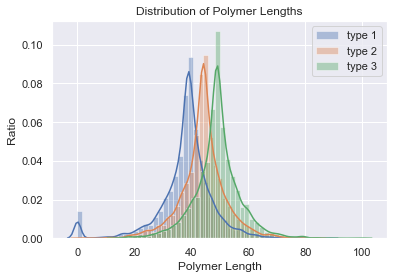

In [18]:
sns.distplot(data.loc[data['cluster'] == 1, 'polymer_length'], label = 'type 1')
sns.distplot(data.loc[data['cluster'] == 2, 'polymer_length'], label = 'type 2')
sns.distplot(data.loc[data['cluster'] == 3, 'polymer_length'], label = 'type 3')
plt.legend()
plt.xlabel('Polymer Length'); plt.ylabel('Ratio'); plt.title('Distribution of Polymer Lengths');

Visualize the classification within a 2D space against polymer length and polymer grafting density

In [19]:
Dict = {1:'blue', 2:'red', 3:'green'}   

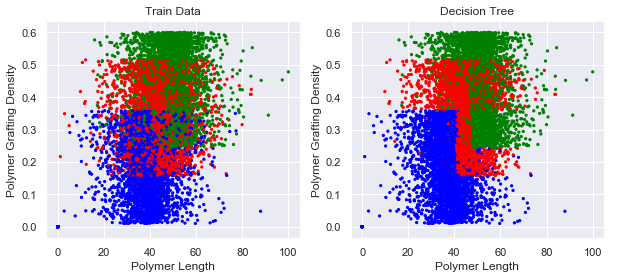

In [20]:
f,axs=plt.subplots(1,2,figsize=(10,4))
axs[0].scatter(train_X.iloc[:,9], train_X.iloc[:,12], c=[Dict[i] for i in train_Y], s=5)
axs[0].set_title('Train Data')

axs[1].scatter(train_X.iloc[:,9], train_X.iloc[:,12], c=[Dict[i] for i in DT.predict(train_X)], s=5)
axs[1].set_title('Decision Tree')

for ax in axs:
    ax.set(xlabel='Polymer Length', ylabel='Polymer Grafting Density')
plt.show()

### Random Forest

Optimal number of features : 11


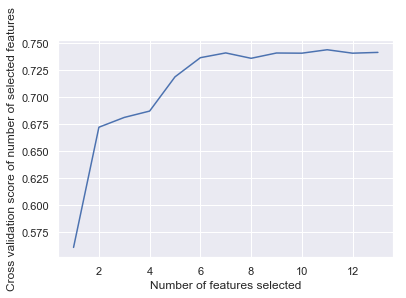

In [21]:
# Use RFECV to pick best features with k-fold cross-validation
# The "accuracy" scoring is proportional to the number of correct classifications
RF = RandomForestClassifier() 
rfecv = RFECV(estimator=RF, step=1, cv=5, scoring='accuracy')   #5-fold cross-validation
rfecv = rfecv.fit(train_X, train_Y)
print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
import matplotlib.pyplot as plt
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score of number of selected features")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

Here we can potentially do rfecv.transform(data) to optimize the performance. However, since our dataset has only 13 features, it is not really necessary do this step, given that the performance is almost equivalent.

Use tuned parameters obtained from grid search (not presented in this project)

Feature ranking:
1. feature 13 (0.463363)
2. feature 10 (0.158060)
3. feature 5 (0.134443)
4. feature 12 (0.127447)
5. feature 9 (0.028056)
6. feature 11 (0.019161)
7. feature 3 (0.014858)
8. feature 2 (0.014801)
9. feature 6 (0.014658)
10. feature 7 (0.012990)
11. feature 1 (0.010270)
12. feature 4 (0.001813)
13. feature 8 (0.000081)


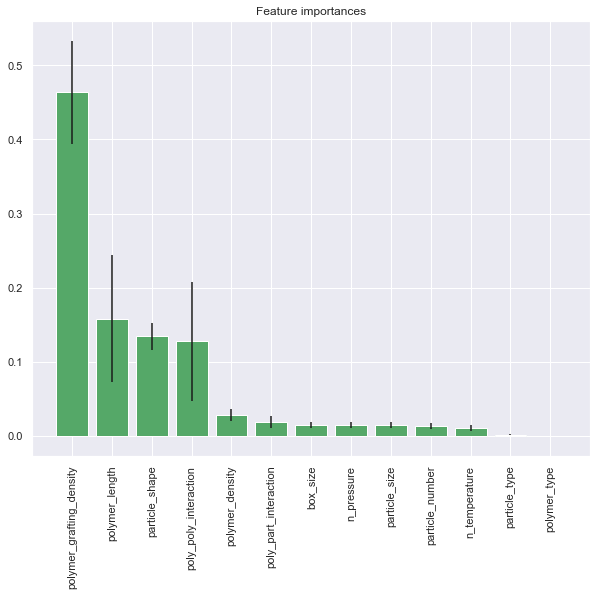

In [22]:
RF = RandomForestClassifier(n_estimators=200, max_depth=12, min_samples_leaf=10, min_impurity_decrease=0.0)      
RF.fit(train_X, train_Y)

importances = RF.feature_importances_
std = np.std([tree.feature_importances_ for tree in RF.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(train_X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f] + 1, importances[indices[f]]))

# Plot the feature importances of the forest

plt.figure(1, figsize=(10, 8))
plt.title("Feature importances")
plt.bar(range(train_X.shape[1]), importances[indices],
       color="g", yerr=std[indices], align="center")
plt.xticks(range(train_X.shape[1]), train_X.columns[indices],rotation=90)
plt.xlim([-1, train_X.shape[1]])
plt.show()

Randomly plot a tree in the forest

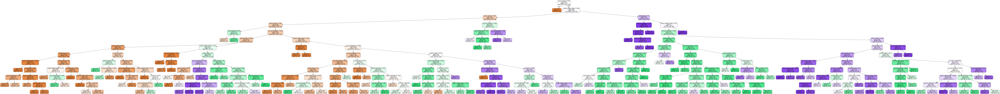

In [23]:
dot_data = tree.export_graphviz(RF.estimators_[random.randint(1,201)],
                            out_file=None,
                            feature_names=train_X.columns,
                            class_names=None,  
                            filled=True, rounded=True,  
                            special_characters=False)
graph = graphviz.Source(dot_data, format="png")
Image(graph.render("tree"))

In [24]:
print(RF)

pred_RF=RF.predict(train_X)
print('Accuracy of the train:', metrics.accuracy_score(pred_RF,train_Y))

pred_RF=RF.predict(test_X)
print('Accuracy of the test:', metrics.accuracy_score(pred_RF,test_Y))

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=12, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
Accuracy of the train: 0.8061857352701158
Accuracy of the test: 0.7603333333333333


Visualize the classification

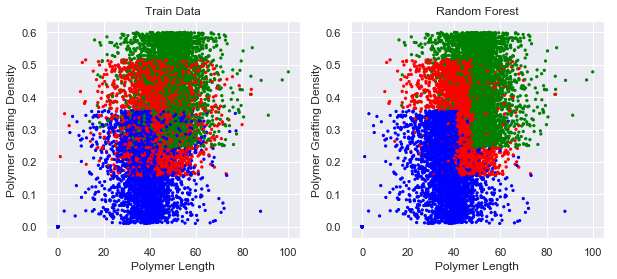

In [25]:
f,axs=plt.subplots(1,2,figsize=(10,4))
axs[0].scatter(train_X.iloc[:,9], train_X.iloc[:,12], c=[Dict[i] for i in train_Y], s=5)
axs[0].set_title('Train Data')

axs[1].scatter(train_X.iloc[:,9], train_X.iloc[:,12], c=[Dict[i] for i in RF.predict(train_X)], s=5)
axs[1].set_title('Random Forest')

for ax in axs:
    ax.set(xlabel='Polymer Length', ylabel='Polymer Grafting Density')
plt.show()

### K-Nearest Neighbors (KNN)

KNN relies on majority voting based on neighbors euclidean distance, and therefore normalization is required to prevent weight bias.

In [26]:
# Data normalization
min_max_scaler = MinMaxScaler()
train_X_n = pd.DataFrame(min_max_scaler.fit_transform(train_X))
test_X_n = pd.DataFrame(min_max_scaler.fit_transform(test_X))

As usual, lets first try default.

In [27]:
KNN=KNeighborsClassifier() 
KNN.fit(train_X_n,train_Y)

print(KNN)

pred_KNN=KNN.predict(train_X_n)
print('Accuracy of the train:', metrics.accuracy_score(pred_KNN,train_Y))

pred_KNN=KNN.predict(test_X_n)
print('Accuracy of the test:', metrics.accuracy_score(pred_KNN,test_Y))

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')
Accuracy of the train: 0.7635874000326424
Accuracy of the test: 0.614


Parameter search is simple for KNN. Just explore the number of neighbors.

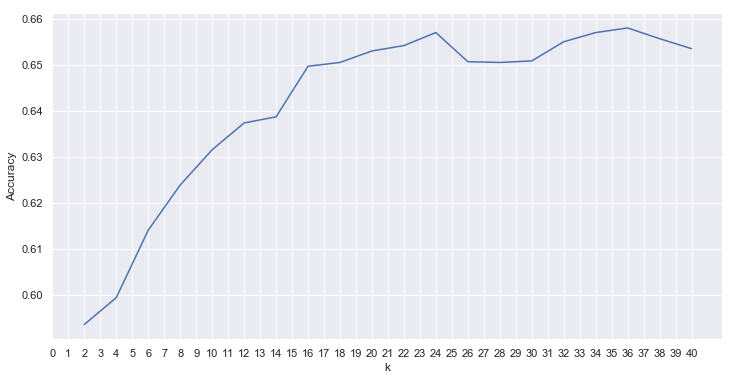

Accuracies for different values of n are: [0.5935     0.59933333 0.614      0.62383333 0.6315     0.63733333
 0.63866667 0.64966667 0.6505     0.653      0.65416667 0.657
 0.65066667 0.6505     0.65083333 0.655      0.657      0.658
 0.65566667 0.6535    ] with the max value as  0.658


In [28]:
k=40 # number of neighbors
a_index=list(range(2,k+1, 2))
a=pd.Series()
x=list(range(0,k+1))
for i in list(range(1,k+1, 2)):
    KNN=KNeighborsClassifier(n_neighbors=i) 
    KNN.fit(train_X_n,train_Y)
    pred_DT=KNN.predict(test_X_n)
    a=a.append(pd.Series(metrics.accuracy_score(pred_DT,test_Y)))
plt.plot(a_index, a)
plt.xticks(x)
fig=plt.gcf()
fig.set_size_inches(12,6)
plt.xlabel("k")
plt.ylabel("Accuracy")
plt.show()
print('Accuracies for different values of n are:',a.values,'with the max value as ',a.values.max())

Accuracy is not improving much after k=24, so lets just stop there.

In [29]:
KNN=KNeighborsClassifier(n_neighbors=24) 
KNN.fit(train_X_n,train_Y)

print(KNN)

pred_KNN=KNN.predict(train_X_n)
print('Accuracy of the train:', metrics.accuracy_score(pred_KNN,train_Y))

pred_KNN=KNN.predict(test_X_n)
print('Accuracy of the test:', metrics.accuracy_score(pred_KNN,test_Y))

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=24, p=2,
           weights='uniform')
Accuracy of the train: 0.7000163212012405
Accuracy of the test: 0.6541666666666667


Visualize the classification result

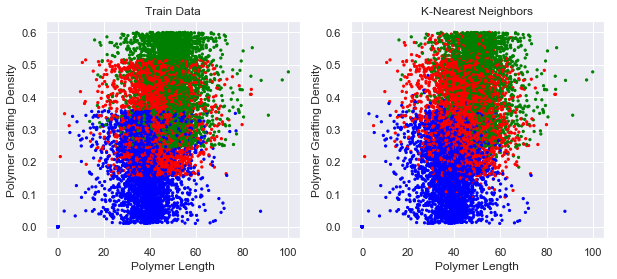

In [30]:
f,axs=plt.subplots(1,2,figsize=(10,4))
axs[0].scatter(train_X.iloc[:,9], train_X.iloc[:,12], c=[Dict[i] for i in train_Y], s=5)
axs[0].set_title('Train Data')

axs[1].scatter(train_X.iloc[:,9], train_X.iloc[:,12], c=[Dict[i] for i in KNN.predict(train_X_n)], s=5)
axs[1].set_title('K-Nearest Neighbors')

for ax in axs:
    ax.set(xlabel='Polymer Length', ylabel='Polymer Grafting Density')
plt.show()

### Cross Validation: K-folds test
k-fold Cross-Validation is used to ensure that the generate model has low bias and low variance. Usually, a value between 5-10 is used in practical Machine Learning scenarios.

In [31]:
kfold = KFold(n_splits=5, random_state=22) # k=5, split the data into 5 equal parts
cv_mean=[]
accuracy=[]
std=[]
classifiers=['KNN','Decision Tree','Random Forest']
models=[KNN, DT, RF]
for i in models:
    model = i
    cv_result = cross_val_score(model, train_X_n,train_Y, cv = kfold, scoring = "accuracy")
    cv_mean.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
models_cv5=pd.DataFrame({'Cross Validation Mean':cv_mean, 'Stdev':std}, index=classifiers)

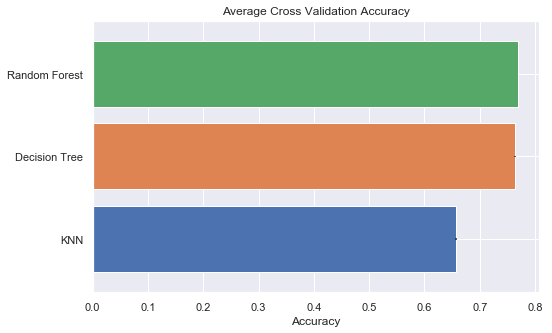

In [42]:
models_cv5['Cross Validation Mean'].plot.barh(width=0.8, yerr=std)
plt.title('Average Cross Validation Accuracy')
fig=plt.gcf()
fig.set_size_inches(8,5)
plt.xlabel('Accuracy')
plt.show()

Confusion Matrix

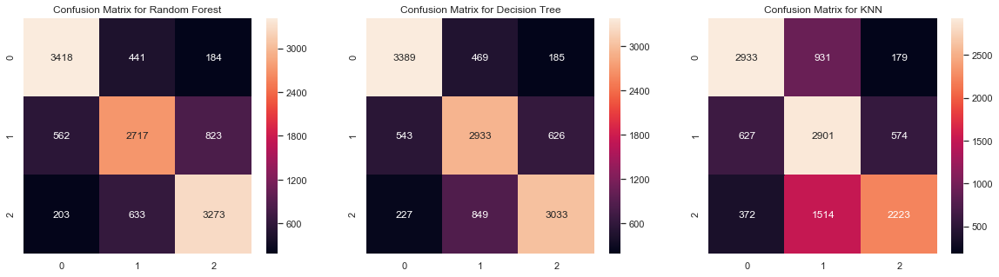

In [33]:
f,ax=plt.subplots(1,3,figsize=(20,5))

y_pred = cross_val_predict(RF,train_X_n,train_Y,cv=5)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[0],annot=True,fmt='2.0f')
ax[0].set_title('Confusion Matrix for Random Forest')

y_pred = cross_val_predict(DT,train_X_n,train_Y,cv=5)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[1],annot=True,fmt='2.0f')
ax[1].set_title('Confusion Matrix for Decision Tree')

y_pred = cross_val_predict(KNN,train_X_n,train_Y,cv=5)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[2],annot=True,fmt='2.0f')
ax[2].set_title('Confusion Matrix for KNN')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
plt.show()

Feature Importance

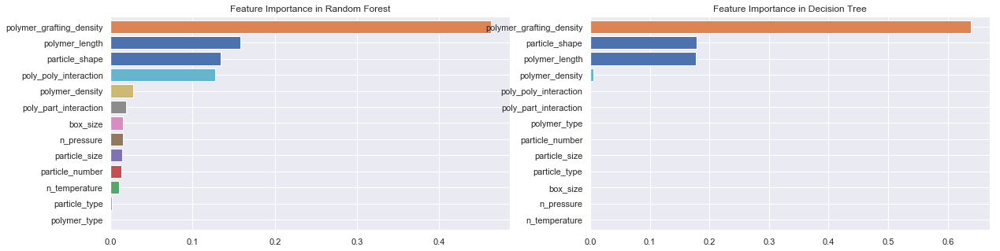

In [34]:
f,ax=plt.subplots(1,2,figsize=(20,5))

pd.Series(RF.feature_importances_,train_X.columns).sort_values(ascending=True).plot.barh(width=0.8,ax=ax[0])
ax[0].set_title('Feature Importance in Random Forest')

pd.Series(DT.feature_importances_,train_X.columns).sort_values(ascending=True).plot.barh(width=0.8,ax=ax[1])
ax[1].set_title('Feature Importance in Decision Tree')

plt.show()

### Two Dimensional Classification

Perform classification using only 2 top ranked features selected from the feature importance analysis

The following function lightens the given color by multiplying a factor.
We will need it to render a better plot presentation later.

In [36]:
def lighten_color(color, amount=0.5):
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

In [37]:
# Create color maps using lighten_color function
cmap_light = ListedColormap([lighten_color('b', 0.4), lighten_color('r', 0.4), lighten_color('g', 0.4)])
cmap_bold = ListedColormap(['blue', 'red', 'green'])

In [38]:
# Create a dict of models that will be used in the function defined below
model_dict = {RF:'Random Forest', DT:'Decision Tree', KNN:'K Nearest Neighbors'}   

In [39]:
# Create new datasets that will be used in the function defined below
train = pd.concat([train_X_n, train_Y.to_frame(name="13")], axis=1)
test = pd.concat([test_X_n, test_Y.to_frame(name="13")], axis=1)
train.name = 'train data'
test.name = 'test data'

Build a function that trains models with the 2 selected features and compares predictions on both train and test data

In [40]:
def twoD_clf(model):
    f,axs=plt.subplots(1,2,figsize=(10,4))
    i = 0
    model.fit(train.iloc[:, [9,12]], train.iloc[:, 13])
        
    # Plot the decision boundary by assigning a color to each
    # point in the mesh [x_min, x_max]X[y_min, y_max].
    h = .02  # step size in the mesh
    x_min, x_max = train.iloc[:, 9].min() - 0.25, train.iloc[:, 9].max() + 0.25
    y_min, y_max = train.iloc[:, 12].min() - 0.25, train.iloc[:, 12].max() + 0.25
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    for df in [train, test]:
        # Put the result into a color plot
        axs[i].pcolormesh(xx, yy, Z, cmap=cmap_light)

        # Plot also the training or testing points
        axs[i].scatter(df.iloc[:, 9], df.iloc[:, 12], c=df.iloc[:, 13], cmap=cmap_bold,
                    s=10)
        axs[i].set_title("classifier = '%s', data = '%s'"
                  % (model_dict[model], df.name))
        i = i + 1
        
        y_pred=model.predict(df.iloc[:, [9,12]])
        if (model in [RF, DT, KNN]):
            print('Accuracy of the %s:' % (df.name), metrics.accuracy_score(y_pred,df.iloc[:, 13]))
        else:
            print('Adjusted Rand index of the %s:' % (df.name), metrics.cluster.adjusted_rand_score((y_pred+1),df.iloc[:, 13]))
        
    for ax in axs:
        ax.set(xlabel='Polymer Length', ylabel='Polymer Grafting Density')

Background colors define the model predicted regions where each NP arrangement type belongs to, and dots represent the real labels. 

#### Random Forest

Accuracy of the train data: 0.7570589195364779
Accuracy of the test data: 0.732


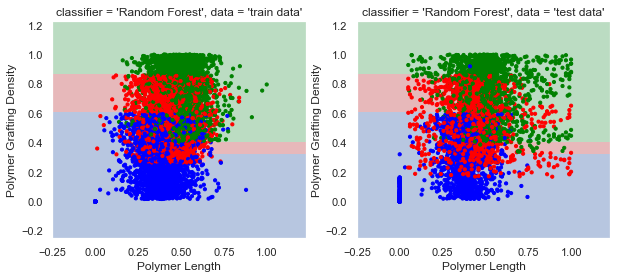

In [41]:
twoD_clf(RF)

#### Decision Tree

Accuracy of the train data: 0.7319242696262445
Accuracy of the test data: 0.7385


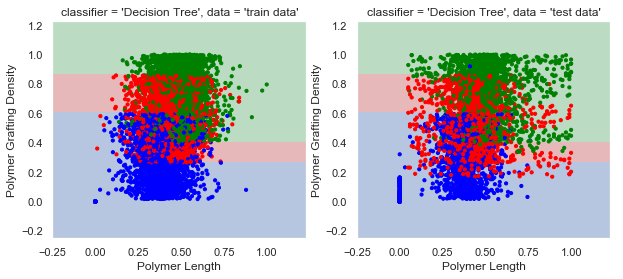

In [43]:
twoD_clf(DT)

#### K-Nearest Neighbors

Accuracy of the train data: 0.7346172678309123
Accuracy of the test data: 0.7231666666666666


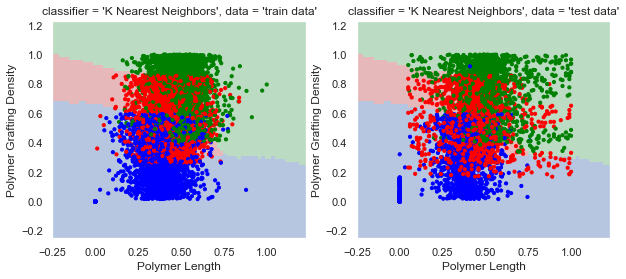

In [44]:
twoD_clf(KNN)

### Unsupervised Clustering

In [45]:
# Set parameters
KM = KMeans(n_clusters=3, random_state=4)
GM = GaussianMixture(n_components=3, covariance_type='full', random_state=52)

# Add ney keys to the dict
model_dict[KM] = 'K-Means'
model_dict[GM] = 'GaussianMixture'

#### KMeans

Adjusted Rand index of the train data: 0.17617962579621224
Adjusted Rand index of the test data: 0.19753165691060356


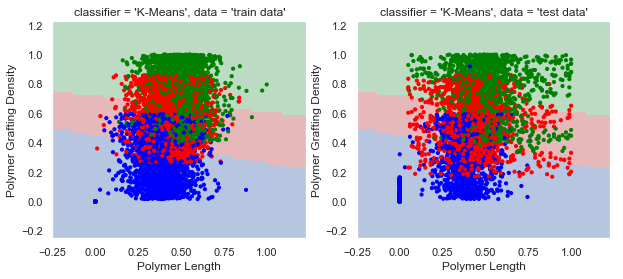

In [46]:
twoD_clf(KM)

#### Gaussian Mixture

Adjusted Rand index of the train data: 0.15714477873345573
Adjusted Rand index of the test data: 0.16655820905944518


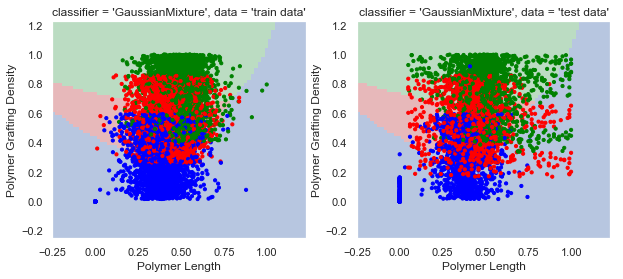

In [47]:
twoD_clf(GM)